Approach:
1. Data Loading and Cleaning- taxi dataset will be loaded and examined for missing or invalid values in order to prepare it or confirm it is approprate for analysis.
2. Data Enrichment- Columns that process data from different columns will be added to the dataset for easier processing
3. Ouery Based Analysis- SQl Queries will be used to summarize the data for specific meaningful questions
4. Interactive Dashboard- dashboard will be created to display visualizations of data for clarity and ease of navigation
5. Insights and Interpretations- What can be inferred about the data from the visualizations and query tables will be made for deeper understanding of dataset

Part 1: Data Ingestion

In [1]:
!pip install polars

Defaulting to user installation because normal site-packages is not writeable


In [2]:
import os
import requests
from urllib.parse import urlparse

os.makedirs('data/raw', exist_ok=True)

files_to_download = {
    "Yellow Taxi Trip Data": "https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_2024-01.parquet",
    "Taxi Zone Lookup Table": "https://d37ci6vzurychx.cloudfront.net/misc/taxi_zone_lookup.csv"
}

for file_name_base, url in files_to_download.items():
    response = requests.get(url)
    parsed_url = urlparse(url)
    original_extension = os.path.splitext(parsed_url.path)[1]

    local_file_name = f'data/raw/{file_name_base}{original_extension}'

    with open(local_file_name, 'wb') as f:
        f.write(response.content)
    print(f"{file_name_base} downloaded successfully to {local_file_name}.")

Yellow Taxi Trip Data downloaded successfully to data/raw/Yellow Taxi Trip Data.parquet.
Taxi Zone Lookup Table downloaded successfully to data/raw/Taxi Zone Lookup Table.csv.


In [21]:
import polars as pl


df_trips = pl.read_parquet('data/raw/Yellow Taxi Trip Data.parquet')

df_zones = pl.read_csv('data/raw/Taxi Zone Lookup Table.csv')

expected_trip_cols=['tpep_pickup_datetime', 'tpep_dropoff_datetime', 'PULocationID', 'DOLocationID',
    'passenger_count', 'trip_distance', 'fare_amount', 'tip_amount',
    'total_amount', 'payment_type']

#Verify all expected columns exist in the dataset
missing_cols = [col for col in expected_trip_cols if col not in df_trips.columns]
if missing_cols:
  raise ValueError(f"Missing columns in yellow taxi data: {missing_cols}")
else:
  print("All expected columns are present in yellow taxi data.")

date_cols = ['tpep_pickup_datetime','tpep_dropoff_datetime']
for col in date_cols:

  if not df_trips[col].dtype.is_temporal(): #Check that date columns are valid datetime types
    raise TypeError(f"Column {col} in yellow taxi data is not of type datetime.")#Raise an exception or exit with an error message if validation fails
print('Date columns are of type datetime.')

print(f'Yellow taxi data has {len(df_trips):,} rows and {len(df_trips.columns)} columns.')
print('\nColumn names and types:')#Report total row count and print a summary to the console
print(df_trips.schema)

All expected columns are present in yellow taxi data.
Date columns are of type datetime.
Yellow taxi data has 2,964,624 rows and 19 columns.

Column names and types:
Schema([('VendorID', Int32), ('tpep_pickup_datetime', Datetime(time_unit='ns', time_zone=None)), ('tpep_dropoff_datetime', Datetime(time_unit='ns', time_zone=None)), ('passenger_count', Int64), ('trip_distance', Float64), ('RatecodeID', Int64), ('store_and_fwd_flag', String), ('PULocationID', Int32), ('DOLocationID', Int32), ('payment_type', Int64), ('fare_amount', Float64), ('extra', Float64), ('mta_tax', Float64), ('tip_amount', Float64), ('tolls_amount', Float64), ('improvement_surcharge', Float64), ('total_amount', Float64), ('congestion_surcharge', Float64), ('Airport_fee', Float64)])


In [4]:
import os
import shutil

os.makedirs('data/processing', exist_ok=True)

files = {
    'Yellow Taxi Trip Data.parquet',
    'Taxi Zone Lookup Table.csv'
}

for f in files:
  src = f
  dest = f'data/raw/{f}'
  if os.path.exists(dest):
    print(f'{f} already in data/raw')
  elif os.path.exists(src):
    shutil.move(src,dest)
    print(f'{f} moved to data/raw')
  else:
    print(f'{f} not found')  #ensure that when code is run the existence of the file doesn't cause errors


gitignore_path = "data/.gitignore"
with open(gitignore_path, "w") as f:
    f.write('Ignore data directory') #creation of the .gitignore
print(f".gitignore created at {gitignore_path}")

Yellow Taxi Trip Data.parquet already in data/raw
Taxi Zone Lookup Table.csv already in data/raw
.gitignore created at data/.gitignore


Part 2: Data Transformation & Analysis

In [5]:
import polars as pl

taxi_file = 'data/raw/Yellow Taxi Trip Data.parquet'
df = pl.read_parquet(taxi_file)
print(f'Yellow taxi data starts with {len(df):,} rows')

before = len(df)
after = len(df)

#Removing rows with null values 
critical_cols = ['tpep_pickup_datetime', 'tpep_dropoff_datetime', 'PULocationID', 'DOLocationID', 'fare_amount']
df = df.drop_nulls(subset=critical_cols)
after = len(df)
print(f'Yellow taxi data now has {len(df):,} rows since {before - after:,} null rows were removed')

#Filtering out invalid trips
before = len(df)
df= df.filter((pl.col('trip_distance') >= 0) &(pl.col('fare_amount') > 0) & (pl.col('fare_amount') <= 500))
after = len(df)
print(f'Yellow taxi data now has {len(df):,} rows since {before - after:,} invalid trip rows were remvoed')

#Removing trips where dropoff time is before pickup time
before = len(df)
df = df.filter(pl.col('tpep_dropoff_datetime')>= pl.col('tpep_pickup_datetime'))
after = len(df)
print(f'Yellow taxi data now has {len(df):,} rows since {before - after:,} invalid dropff time rows were removed')

#Documenting how many rows were removed
rows_removed =len(pl.read_parquet(taxi_file)) - len(df)
print(f'{rows_removed} rows removed overall')

Yellow taxi data starts with 2,964,624 rows
Yellow taxi data now has 2,964,624 rows since 0 null rows were removed
Yellow taxi data now has 2,926,237 rows since 38,387 invalid trip rows were remvoed
Yellow taxi data now has 2,926,181 rows since 56 invalid dropff time rows were removed
38443 rows removed overall


After cleaning the dataset retained 2.9 million trips which provides sufficient data for analysis of trips, fares and payments.

In [6]:
import polars as pl

df = df.with_columns(((pl.col("tpep_dropoff_datetime") - pl.col("tpep_pickup_datetime")).dt.total_seconds() / 60).alias("trip_duration_minutes"))

df = df.with_columns(
    pl.when(pl.col("trip_duration_minutes") > 0)
    .then(pl.col("trip_distance") / (pl.col("trip_duration_minutes") / 60))
    .otherwise(None)
    .alias("trip_speed_mph")
)

df = df.with_columns(
    pl.col("tpep_pickup_datetime").dt.hour().alias("pickup_hour")
)

df = df.with_columns(
    pl.col("tpep_pickup_datetime").dt.strftime("%A").alias("pickup_day_of_week")
)
#Creation of new columns
df.select([
    "trip_duration_minutes",
    "trip_speed_mph",
    "pickup_hour",
    "pickup_day_of_week"
]).head()

trip_duration_minutes,trip_speed_mph,pickup_hour,pickup_day_of_week
f64,f64,i8,str
19.8,5.212121,0,"""Monday"""
6.6,16.363636,0,"""Monday"""
17.916667,15.739535,0,"""Monday"""
8.3,10.120482,0,"""Monday"""
6.1,7.868852,0,"""Monday"""


In [7]:
!pip install duckdb

Defaulting to user installation because normal site-packages is not writeable


In [22]:
import duckdb

# Create a DuckDB connection

con = duckdb.connect()


con.register("trips", df)


zone_lookup = pl.read_csv("data/raw/Taxi Zone Lookup Table.csv").to_pandas()
con.register("zones", zone_lookup)

print("Tables loaded into DuckDB!")


Tables loaded into DuckDB!


Query m indentifies the locations with the highest total number of trips

In [9]:
con.execute("""
SELECT
    z.Zone AS pickup_zone,
    COUNT(*) AS total_trips
FROM trips t
JOIN zones z
ON t.PULocationID = z.LocationID
GROUP BY pickup_zone
ORDER BY total_trips DESC
LIMIT 10
""").df()


,pickup_zone,total_trips
0,Midtown Center,141722
1,Upper East Side South,141250
2,JFK Airport,141091
3,Upper East Side North,135317
4,Midtown East,105451
5,Times Sq/Theatre District,104603
6,Penn Station/Madison Sq West,103260
7,Lincoln Square East,102960
8,LaGuardia Airport,88554
9,Upper West Side South,87636


From the results, it can be seen that the top pickup zones are Midtown Center, Upper East Side South and JFK Airport. These locations align with what is expected of high tourist activity area and patterns

Query n calculates the average fare amount for each hour of the day (Ordered by ascending hour)

In [24]:
con.execute("""
SELECT
    pickup_hour,
    AVG(fare_amount) AS avg_fare
FROM trips
GROUP BY pickup_hour
ORDER BY pickup_hour
""").df()


,pickup_hour,avg_fare
0,0,19.907082
1,1,18.165226
2,2,17.134261
3,3,19.017725
4,4,23.698342
5,5,27.688250
6,6,22.198119
7,7,18.881388
8,8,17.974696
9,9,18.052943


From the results, it can be seen that 4am to 6am has the highest average fare amount. This is likely due to those being the least busy hours of the day where the trips that occur are longer or originate from higher-demand locations, therefore resulting in higher fairs.

Query o calculates what percentage of trips use each payment type

In [11]:
con.execute("""
SELECT
    payment_type,
    COUNT(*) * 100.0 / SUM(COUNT(*)) OVER() AS percentage
FROM trips
GROUP BY payment_type
ORDER BY percentage DESC
""").df()

,payment_type,percentage
0,1,79.244756
1,2,14.715392
2,0,4.715976
3,4,0.855552
4,3,0.468324


Credit card payments are shown to be the most frequently used payment type likely due to its convinience and widespread acceptance among taxi drrivers

Query p calculates the average tip percentage by each day of the week for credit card payments

In [12]:
con.execute("""
SELECT
    pickup_day_of_week,
    AVG(tip_amount / fare_amount * 100) AS avg_tip_pct
FROM trips
WHERE payment_type = 1
GROUP BY pickup_day_of_week
ORDER BY avg_tip_pct DESC
""").df()


,pickup_day_of_week,avg_tip_pct
0,Monday,39.830892
1,Thursday,30.112475
2,Friday,27.772864
3,Saturday,26.609285
4,Tuesday,26.070627
5,Wednesday,25.758151
6,Sunday,25.344118


Mondays are seen to have the higher tip percentages. This could be related to patterns in passenger behaviours such as, being the first workday of the week, when traffic is high, quick service is appreciated more and therefore leads to higher tipping

Query q indentifies the top 5 most common pickup-dropoff zone pairs

In [13]:
con.execute("""
SELECT
    pz.Zone AS pickup_zone,
    dz.Zone AS dropoff_zone,
    COUNT(*) AS trips
FROM trips t
JOIN zones pz ON t.PULocationID = pz.LocationID
JOIN zones dz ON t.DOLocationID = dz.LocationID
GROUP BY pickup_zone, dropoff_zone
ORDER BY trips DESC
LIMIT 5
""").df()


,pickup_zone,dropoff_zone,trips
0,Upper East Side South,Upper East Side North,21708
1,Upper East Side North,Upper East Side South,19269
2,Upper East Side North,Upper East Side North,15626
3,Upper East Side South,Upper East Side South,14559
4,Midtown Center,Upper East Side South,10170


From these results it can be seen that the Upper East Side is the location with the most frequent trips. This is likely due to its high city activity that caters both tourists and locals on a regular basis

Part 3: Dashboard Development

In [14]:
!pip install plotly

Defaulting to user installation because normal site-packages is not writeable


In [15]:
import plotly.express as px
import pandas as pd

pdf = df.to_pandas()

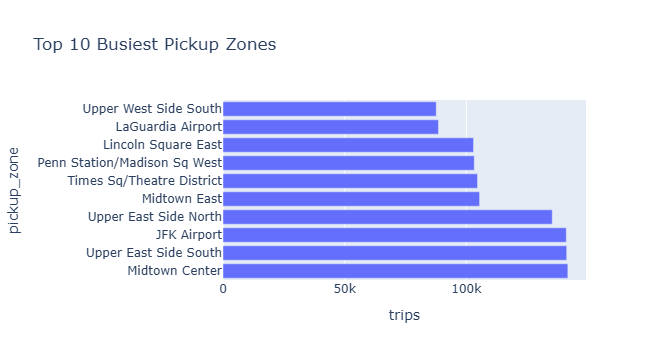

In [16]:
top_pickups = con.execute("""
SELECT
    z.Zone AS pickup_zone,
    COUNT(*) AS trips
FROM trips t
JOIN zones z
ON t.PULocationID = z.LocationID
GROUP BY pickup_zone
ORDER BY trips DESC
LIMIT 10
""").df()

fig = px.bar(top_pickups,
             x="trips",
             y="pickup_zone",
             orientation='h',
             title="Top 10 Busiest Pickup Zones")

fig.show()


High tourist areas appear to be among the top busiest pickup zones in the city, clearly aligning with visitor expectations

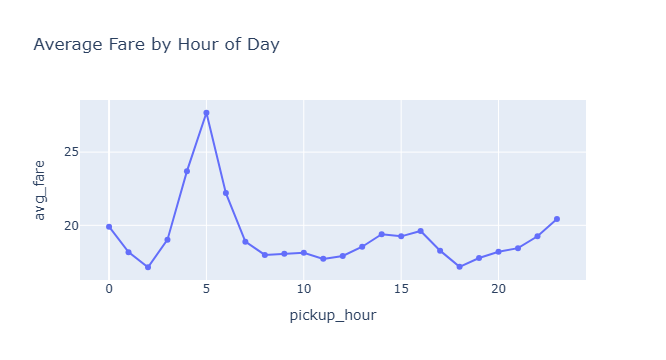

In [17]:
avg_fare_hour = con.execute("""
SELECT
    pickup_hour,
    AVG(fare_amount) AS avg_fare
FROM trips
GROUP BY pickup_hour
ORDER BY pickup_hour
""").df()

fig = px.line(avg_fare_hour,
              x="pickup_hour",
              y="avg_fare",
              markers=True,
              title="Average Fare by Hour of Day")

fig.show()

The less busier hours of the day, 4-6am appear to have higher average fares. This could be infulenced by the location differences and lenghts of trips needed by the few passengers that request the trip hence requiring higher fares.

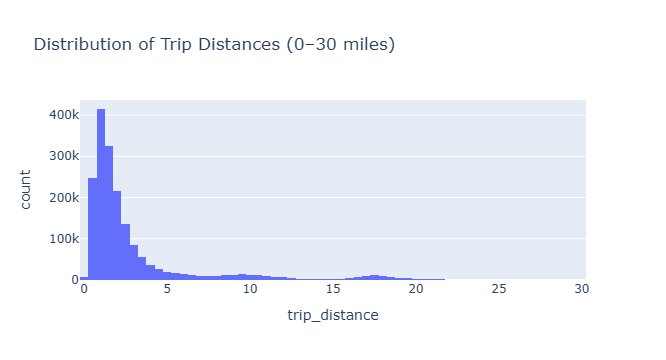

In [18]:
clean_pdf = pdf[(pdf["trip_distance"] > 0.1) & (pdf["trip_distance"] < 100)]
filtered_df = clean_pdf[
    (clean_pdf["pickup_hour"].between(6,18)) &
    (clean_pdf["payment_type"].isin([1,2]))
]

fig = px.histogram(
    filtered_df[filtered_df["trip_distance"] <= 30],
    x="trip_distance",
    nbins=60,
    title="Distribution of Trip Distances (0–30 miles)"
)
#Orignal histogram had no variety so df had to be cleaned
fig.show()


The majority of trips do not require long distances. This likely reflects that frequently visited locations in New York are located close togther for the convience of both visitors and locals.

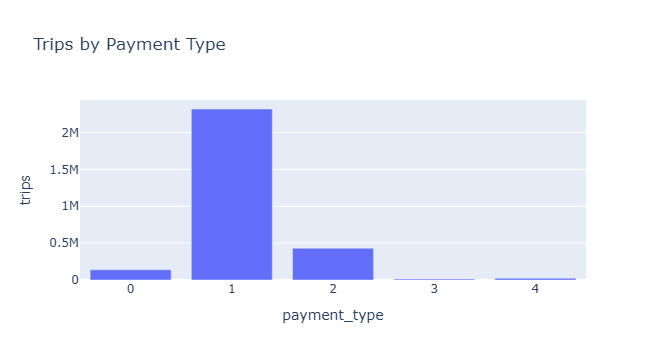

In [19]:
payment_breakdown = con.execute("""
SELECT
    payment_type,
    COUNT(*) AS trips
FROM trips
GROUP BY payment_type
ORDER BY trips DESC
""").df()

fig = px.bar(payment_breakdown,
             x="payment_type",
             y="trips",
             title="Trips by Payment Type")

fig.show()


Credit cards are the most frequently used payment type for taxi trips. This is likely due to their convenience and wide acceptance, making travel easier for both locals and tourists.

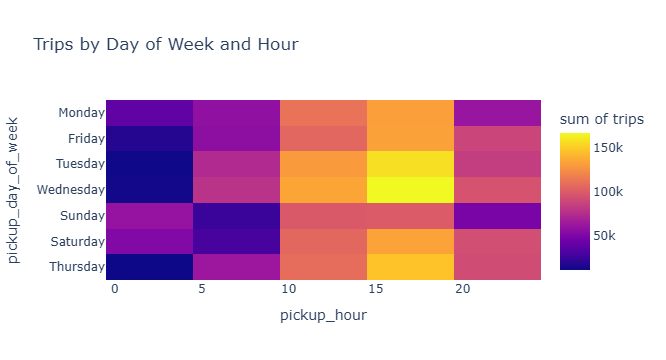

In [20]:
heatmap_data = con.execute("""
SELECT
    pickup_day_of_week,
    pickup_hour,
    COUNT(*) AS trips
FROM trips
GROUP BY pickup_day_of_week, pickup_hour
""").df()

fig = px.density_heatmap(
    heatmap_data,
    x="pickup_hour",
    y="pickup_day_of_week",
    z="trips",
    title="Trips by Day of Week and Hour"
)

fig.show()

Across all days of the week, 3pm to 7pm are the busiest hours of the day. This patterns is likely due to people travelling during these hours whether it be leaving work, trying to return home before nightfall or going out at night

AI Tools Used: ChatGPt: used to figure out what tables needed to be created in order to run queries/ create charts, to debug and correct code when errors were unknown, and as a walkthrough to setting up and successfully running app.py. Google Colab was initially used to plan code layout before being transferred to Jupyter Notebook so its AI Autocomplete suggested some code sn